In [1]:
from google.colab import drive
drive.mount('/content/gdrive')

!cp gdrive/MyDrive/Colab/utils.py .
!cp gdrive/MyDrive/Colab/dataloader.py .

!unzip gdrive/MyDrive/Colab/VOCdevkit.zip

Streaming output truncated to the last 5000 lines.
  inflating: VOCdevkit/VOC2007/JPEGImages/006230.jpg  
  inflating: VOCdevkit/VOC2007/JPEGImages/006231.jpg  
  inflating: VOCdevkit/VOC2007/JPEGImages/006232.jpg  
  inflating: VOCdevkit/VOC2007/JPEGImages/006233.jpg  
  inflating: VOCdevkit/VOC2007/JPEGImages/006234.jpg  
  inflating: VOCdevkit/VOC2007/JPEGImages/006235.jpg  
  inflating: VOCdevkit/VOC2007/JPEGImages/006236.jpg  
  inflating: VOCdevkit/VOC2007/JPEGImages/006237.jpg  
  inflating: VOCdevkit/VOC2007/JPEGImages/006238.jpg  
  inflating: VOCdevkit/VOC2007/JPEGImages/006239.jpg  
  inflating: VOCdevkit/VOC2007/JPEGImages/006240.jpg  
  inflating: VOCdevkit/VOC2007/JPEGImages/006241.jpg  
  inflating: VOCdevkit/VOC2007/JPEGImages/006242.jpg  
  inflating: VOCdevkit/VOC2007/JPEGImages/006243.jpg  
  inflating: VOCdevkit/VOC2007/JPEGImages/006244.jpg  
  inflating: VOCdevkit/VOC2007/JPEGImages/006245.jpg  
  inflating: VOCdevkit/VOC2007/JPEGImages/006246.jpg  
  inflating: V

In [2]:
import math
import os
import numpy as np
import matplotlib.pyplot as plt
from dataloader import VOCDataloader
from utils import plot_bounding_boxes, non_maximum_suppression, mean_average_precision

import torch
from torchvision import transforms, models

In [3]:
def sliding_windows(image, window_size=100, aspect_ratio=1, stride=10):

    window_height = int(window_size * math.sqrt(aspect_ratio))
    window_width = int(window_size / math.sqrt(aspect_ratio))
        
    windows = np.empty((0, 3, window_height, window_width))
    bounding_boxes = np.empty((0, 4))

    for y in range(0, image.shape[0]-window_height, stride):
        for x in range(0, image.shape[1]-window_width, stride):
             window = image[y:y+window_height, x:x+window_width]
             window = np.transpose(window, (2, 0, 1))
             windows = np.append(windows, [window], axis=0)
             bounding_boxes = np.append(bounding_boxes, [[x, y, x+window_width, y+window_height]], axis=0)

    return windows, bounding_boxes

In [4]:
# Use GPU if available
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print('Device:', device)

# Number of classes in the dataset
n_classes = 21

# Batch size for training (change depending on how much memory you have)
batch_size = 8

# Number of epochs to train for
n_epochs = 15

# Input size for ResNet-50
input_size = 224

# Load the ResNet-50 model
model = models.resnet50()

# Change number of softmax outputs
model.avgpool = torch.nn.AdaptiveAvgPool2d(1)
num_ftrs = model.fc.in_features

# Last layer will output 21 softmax outputs, where 20 of them belong to original class and one belongs to background class
model.fc = torch.nn.Linear(num_ftrs, 21)
model.to(device)

# Load the trained model weights
model.load_state_dict(torch.load('gdrive/MyDrive/Colab/model_14.pth'))
# model.load_state_dict(torch.load('Model'))
model.eval()  # Since we are using only for testing
model.requires_grad_(False)

Device: cuda:0


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [5]:
image_set = 'test'

# Root directory for VOC data
voc_root = os.path.join(os.getcwd(), 'VOCdevkit', 'VOC2007')

# Create dataloader object
dataloader = VOCDataloader(voc_root, image_set=image_set)
print('Number of samples for', image_set, ':', dataloader.__len__())

test_transforms = transforms.Compose([# transforms.Resize(input_size),
                                      # transforms.CenterCrop(input_size),
                                      transforms.ToTensor(),
                                      transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
                                      ])

Number of samples for test : 4952



Image: 1
Total Bounding Boxes:
	Before applying NMS: 6
	After applying NMS: 1


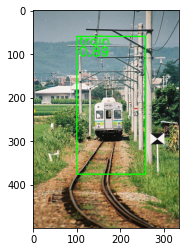


Image: 2
Total Bounding Boxes:
	Before applying NMS: 0
	After applying NMS: 0
No object detected


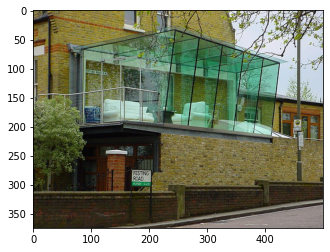


Image: 3
Total Bounding Boxes:
	Before applying NMS: 1
	After applying NMS: 1


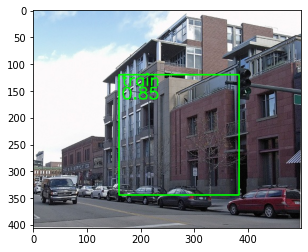


Image: 4
Total Bounding Boxes:
	Before applying NMS: 19
	After applying NMS: 1


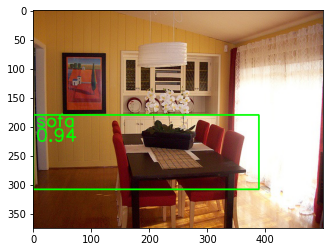


Image: 5
Total Bounding Boxes:
	Before applying NMS: 14
	After applying NMS: 1


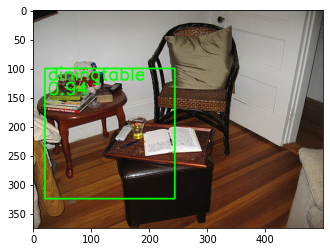


Image: 6
Total Bounding Boxes:
	Before applying NMS: 0
	After applying NMS: 0
No object detected


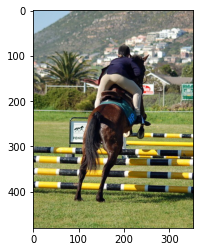


Image: 7
Total Bounding Boxes:
	Before applying NMS: 74
	After applying NMS: 1


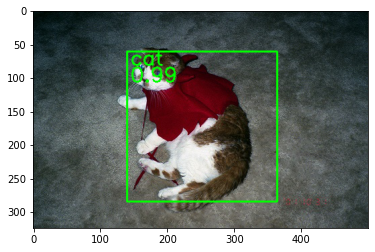


Image: 8
Total Bounding Boxes:
	Before applying NMS: 4
	After applying NMS: 1


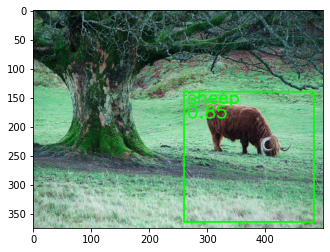


Image: 9
Total Bounding Boxes:
	Before applying NMS: 17
	After applying NMS: 1


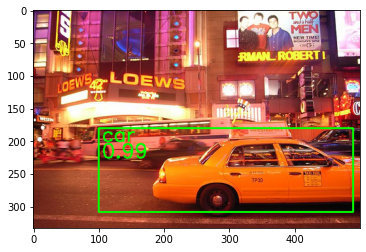


Image: 10
Total Bounding Boxes:
	Before applying NMS: 19
	After applying NMS: 2


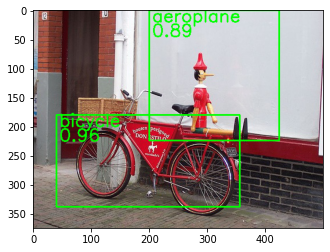


Image: 11
Total Bounding Boxes:
	Before applying NMS: 17
	After applying NMS: 1


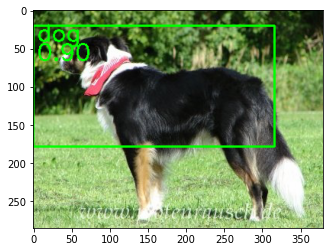


Image: 12
Total Bounding Boxes:
	Before applying NMS: 145
	After applying NMS: 1


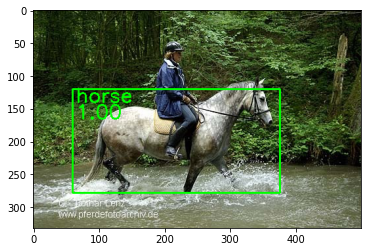


Image: 13
Total Bounding Boxes:
	Before applying NMS: 0
	After applying NMS: 0
No object detected


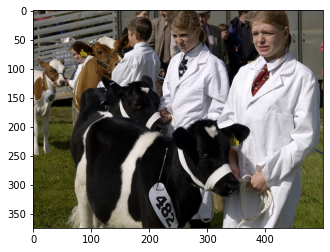


Image: 14
Total Bounding Boxes:
	Before applying NMS: 0
	After applying NMS: 0
No object detected


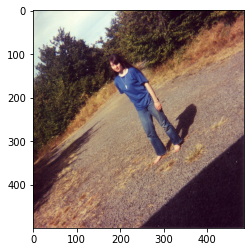


Image: 15
Total Bounding Boxes:
	Before applying NMS: 311
	After applying NMS: 3


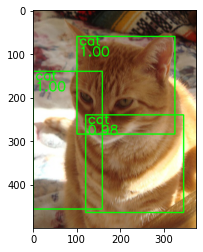


Image: 16
Total Bounding Boxes:
	Before applying NMS: 57
	After applying NMS: 1


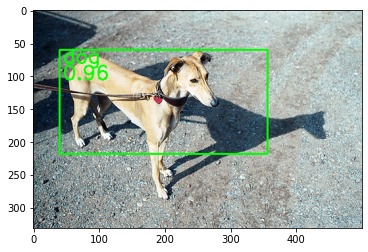


Image: 17
Total Bounding Boxes:
	Before applying NMS: 144
	After applying NMS: 1


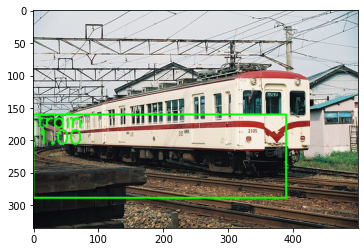


Image: 18
Total Bounding Boxes:
	Before applying NMS: 30
	After applying NMS: 1


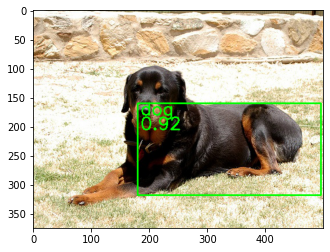


Image: 19
Total Bounding Boxes:
	Before applying NMS: 88
	After applying NMS: 1


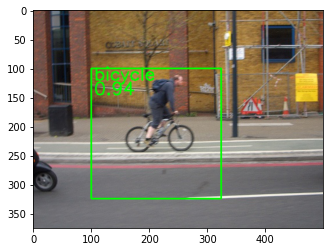


Image: 20
Total Bounding Boxes:
	Before applying NMS: 236
	After applying NMS: 2


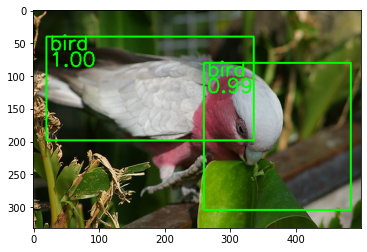


Image: 21
Total Bounding Boxes:
	Before applying NMS: 101
	After applying NMS: 2


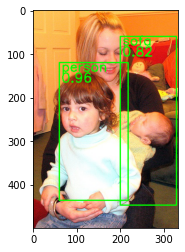


Image: 22
Total Bounding Boxes:
	Before applying NMS: 320
	After applying NMS: 2


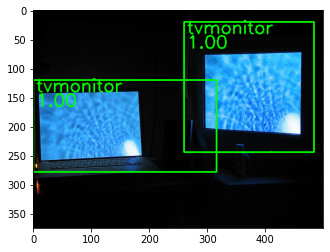


Image: 23
Total Bounding Boxes:
	Before applying NMS: 159
	After applying NMS: 1


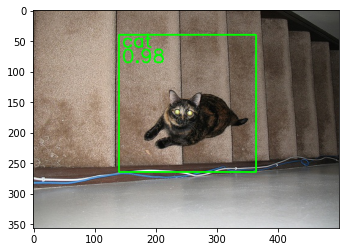


Image: 24
Total Bounding Boxes:
	Before applying NMS: 199
	After applying NMS: 1


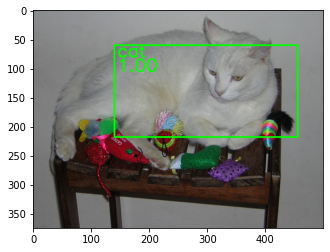


Image: 25
Total Bounding Boxes:
	Before applying NMS: 174
	After applying NMS: 1


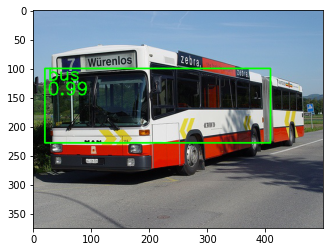


Image: 26
Total Bounding Boxes:
	Before applying NMS: 1
	After applying NMS: 1


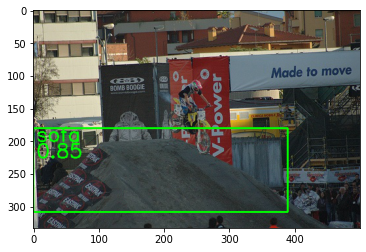


Image: 27
Total Bounding Boxes:
	Before applying NMS: 101
	After applying NMS: 1


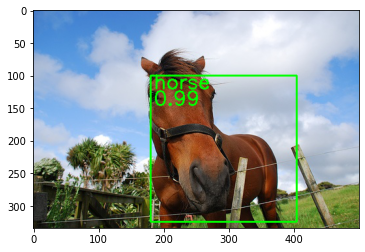


Image: 28
Total Bounding Boxes:
	Before applying NMS: 211
	After applying NMS: 1


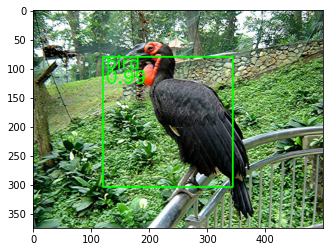


Image: 29
Total Bounding Boxes:
	Before applying NMS: 61
	After applying NMS: 1


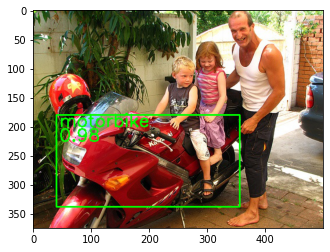


Image: 30
Total Bounding Boxes:
	Before applying NMS: 50
	After applying NMS: 2


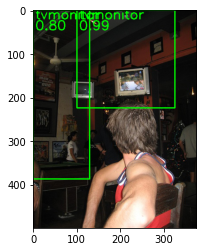


Image: 31
Total Bounding Boxes:
	Before applying NMS: 47
	After applying NMS: 2


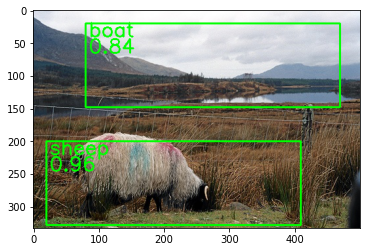


Image: 32
Total Bounding Boxes:
	Before applying NMS: 116
	After applying NMS: 1


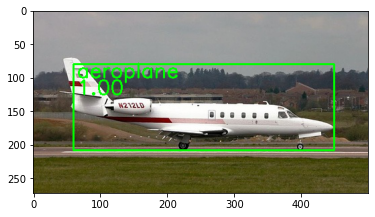


Image: 33
Total Bounding Boxes:
	Before applying NMS: 65
	After applying NMS: 2


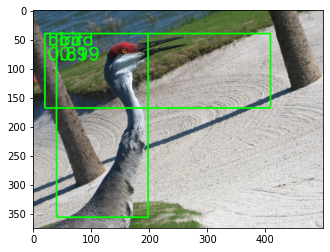


Image: 34
Total Bounding Boxes:
	Before applying NMS: 80
	After applying NMS: 1


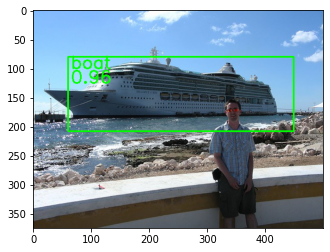


Image: 35
Total Bounding Boxes:
	Before applying NMS: 0
	After applying NMS: 0
No object detected


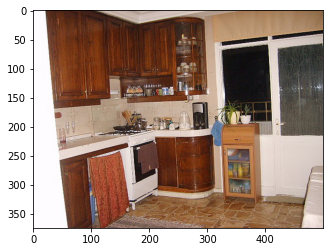


Image: 36
Total Bounding Boxes:
	Before applying NMS: 112
	After applying NMS: 1


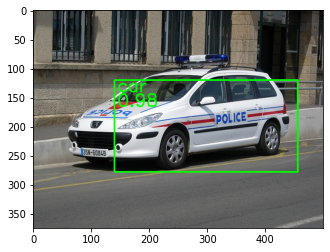


Image: 37
Total Bounding Boxes:
	Before applying NMS: 300
	After applying NMS: 1


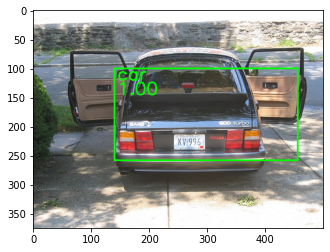


Image: 38
Total Bounding Boxes:
	Before applying NMS: 3
	After applying NMS: 1


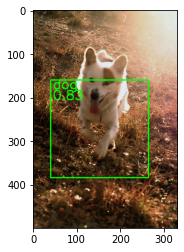


Image: 39
Total Bounding Boxes:
	Before applying NMS: 27
	After applying NMS: 1


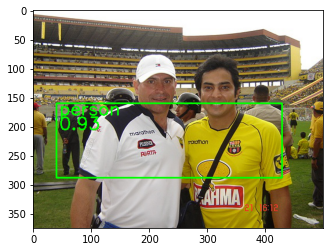


Image: 40
Total Bounding Boxes:
	Before applying NMS: 256
	After applying NMS: 2


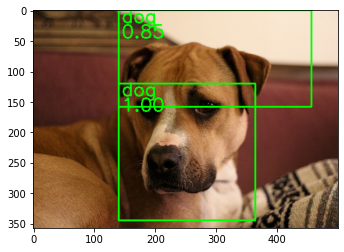


Image: 41
Total Bounding Boxes:
	Before applying NMS: 197
	After applying NMS: 1


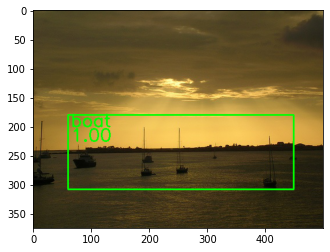


Image: 42
Total Bounding Boxes:
	Before applying NMS: 181
	After applying NMS: 2


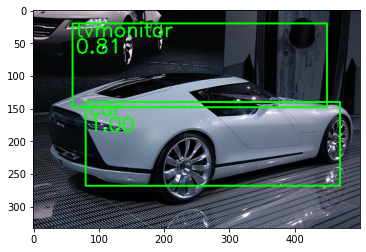


Image: 43
Total Bounding Boxes:
	Before applying NMS: 6
	After applying NMS: 2


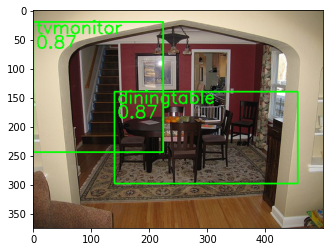


Image: 44
Total Bounding Boxes:
	Before applying NMS: 0
	After applying NMS: 0
No object detected


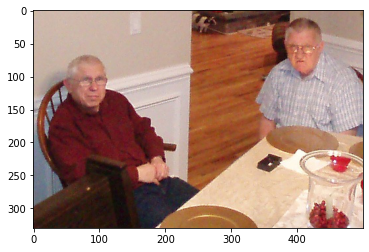


Image: 45
Total Bounding Boxes:
	Before applying NMS: 0
	After applying NMS: 0
No object detected


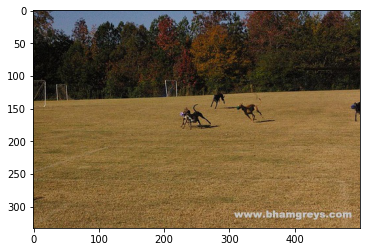


Image: 46
Total Bounding Boxes:
	Before applying NMS: 0
	After applying NMS: 0
No object detected


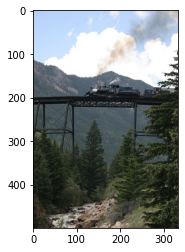


Image: 47
Total Bounding Boxes:
	Before applying NMS: 228
	After applying NMS: 1


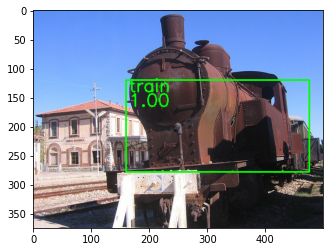


Image: 48
Total Bounding Boxes:
	Before applying NMS: 0
	After applying NMS: 0
No object detected


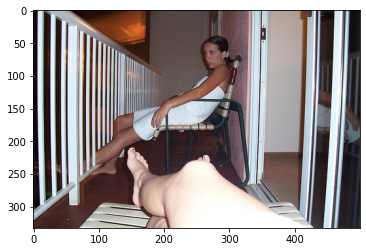


Image: 49
Total Bounding Boxes:
	Before applying NMS: 97
	After applying NMS: 1


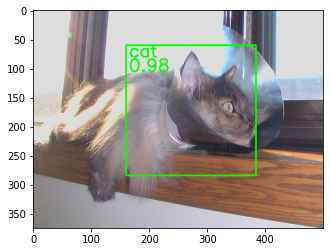


Image: 50
Total Bounding Boxes:
	Before applying NMS: 70
	After applying NMS: 1


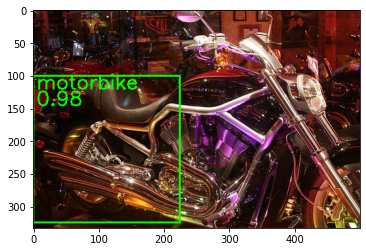


Image: 51
Total Bounding Boxes:
	Before applying NMS: 74
	After applying NMS: 1


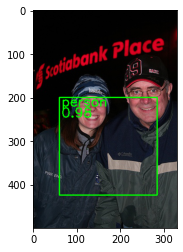


Image: 52
Total Bounding Boxes:
	Before applying NMS: 142
	After applying NMS: 1


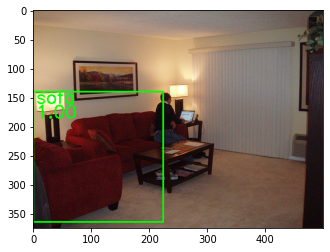


Image: 53
Total Bounding Boxes:
	Before applying NMS: 0
	After applying NMS: 0
No object detected


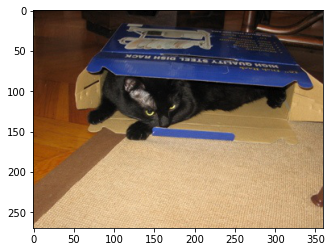


Image: 54
Total Bounding Boxes:
	Before applying NMS: 32
	After applying NMS: 1


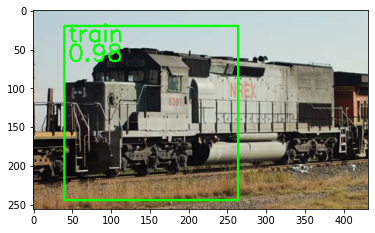


Image: 55
Total Bounding Boxes:
	Before applying NMS: 0
	After applying NMS: 0
No object detected


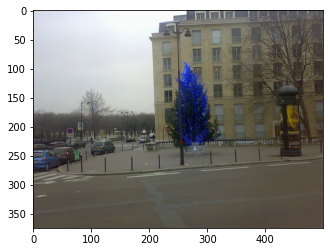


Image: 56
Total Bounding Boxes:
	Before applying NMS: 28
	After applying NMS: 1


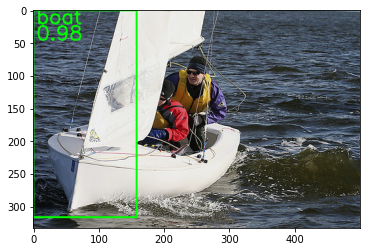


Image: 57
Total Bounding Boxes:
	Before applying NMS: 215
	After applying NMS: 1


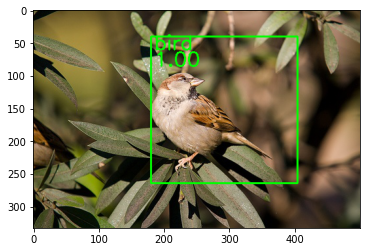


Image: 58
Total Bounding Boxes:
	Before applying NMS: 236
	After applying NMS: 2


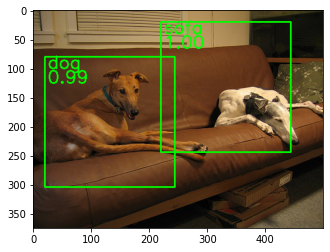


Image: 59
Total Bounding Boxes:
	Before applying NMS: 0
	After applying NMS: 0
No object detected


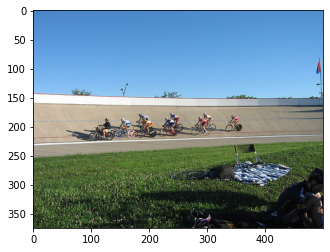


Image: 60
Total Bounding Boxes:
	Before applying NMS: 268
	After applying NMS: 1


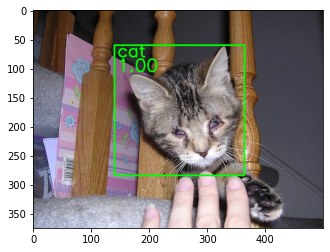


Image: 61
Total Bounding Boxes:
	Before applying NMS: 44
	After applying NMS: 2


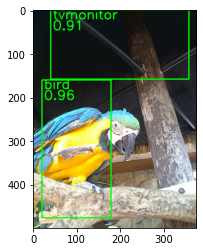


Image: 62
Total Bounding Boxes:
	Before applying NMS: 147
	After applying NMS: 1


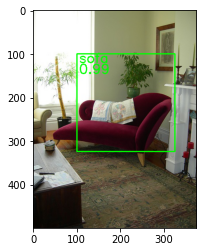


Image: 63
Total Bounding Boxes:
	Before applying NMS: 279
	After applying NMS: 1


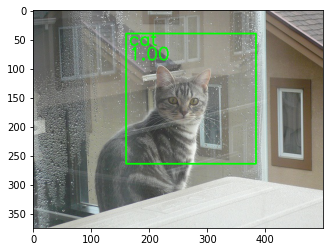


Image: 64
Total Bounding Boxes:
	Before applying NMS: 32
	After applying NMS: 1


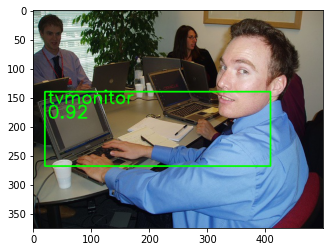


Image: 65
Total Bounding Boxes:
	Before applying NMS: 0
	After applying NMS: 0
No object detected


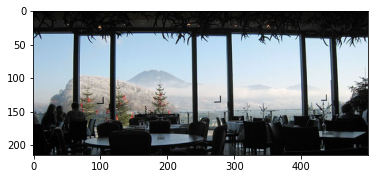


Image: 66
Total Bounding Boxes:
	Before applying NMS: 14
	After applying NMS: 1


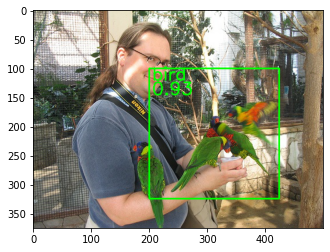


Image: 67
Total Bounding Boxes:
	Before applying NMS: 0
	After applying NMS: 0
No object detected


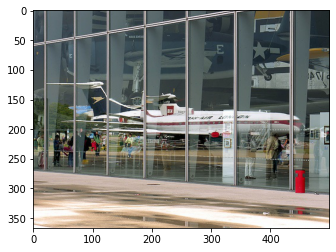


Image: 68
Total Bounding Boxes:
	Before applying NMS: 0
	After applying NMS: 0
No object detected


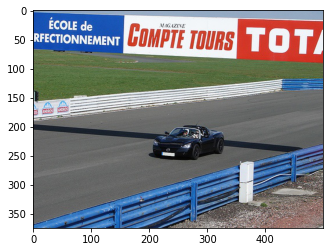


Image: 69
Total Bounding Boxes:
	Before applying NMS: 46
	After applying NMS: 1


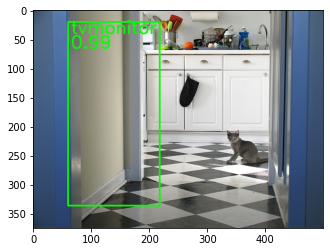


Image: 70
Total Bounding Boxes:
	Before applying NMS: 0
	After applying NMS: 0
No object detected


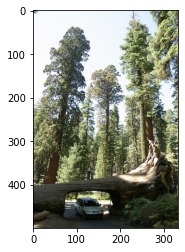


Image: 71
Total Bounding Boxes:
	Before applying NMS: 94
	After applying NMS: 1


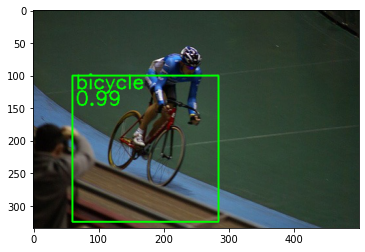


Image: 72
Total Bounding Boxes:
	Before applying NMS: 81
	After applying NMS: 1


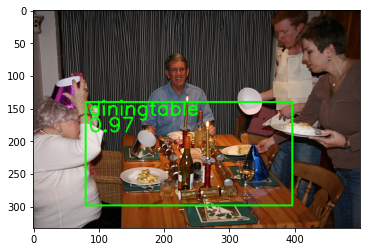


Image: 73
Total Bounding Boxes:
	Before applying NMS: 107
	After applying NMS: 1


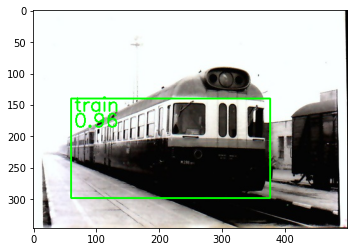


Image: 74
Total Bounding Boxes:
	Before applying NMS: 267
	After applying NMS: 2


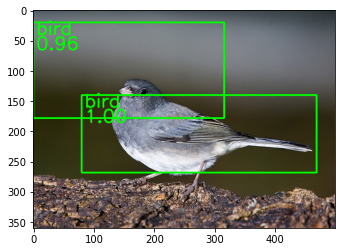


Image: 75
Total Bounding Boxes:
	Before applying NMS: 268
	After applying NMS: 1


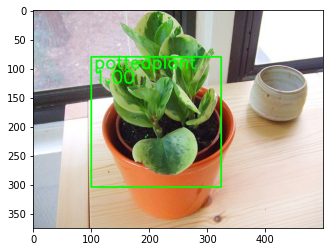


Image: 76
Total Bounding Boxes:
	Before applying NMS: 0
	After applying NMS: 0
No object detected


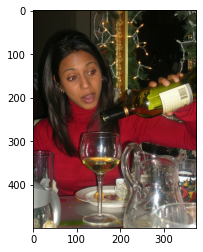


Image: 77
Total Bounding Boxes:
	Before applying NMS: 213
	After applying NMS: 1


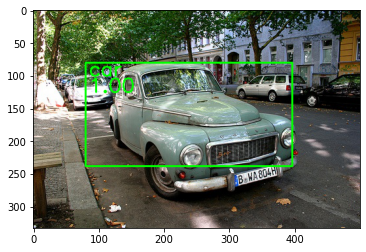


Image: 78
Total Bounding Boxes:
	Before applying NMS: 0
	After applying NMS: 0
No object detected


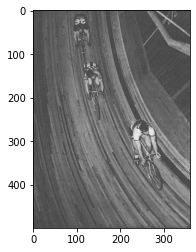


Image: 79
Total Bounding Boxes:
	Before applying NMS: 32
	After applying NMS: 1


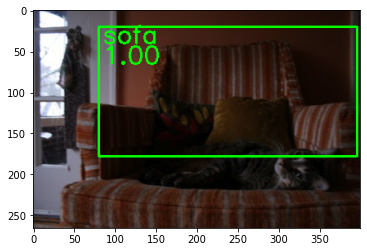


Image: 80
Total Bounding Boxes:
	Before applying NMS: 57
	After applying NMS: 1


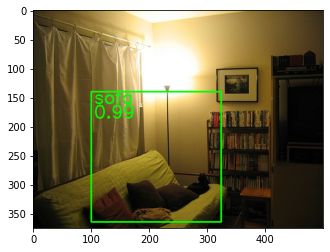


Image: 81
Total Bounding Boxes:
	Before applying NMS: 36
	After applying NMS: 1


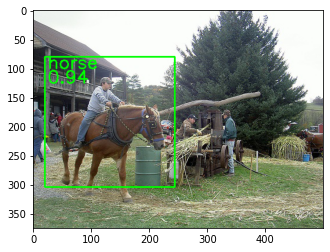


Image: 82
Total Bounding Boxes:
	Before applying NMS: 242
	After applying NMS: 1


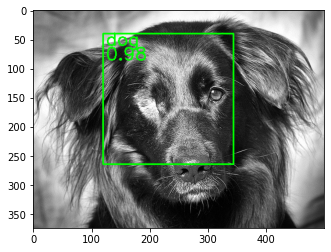


Image: 83
Total Bounding Boxes:
	Before applying NMS: 115
	After applying NMS: 1


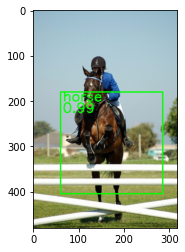


Image: 84
Total Bounding Boxes:
	Before applying NMS: 223
	After applying NMS: 1


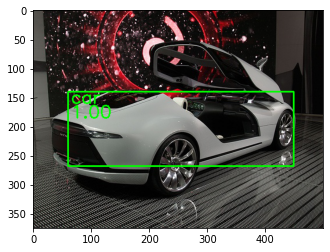


Image: 85
Total Bounding Boxes:
	Before applying NMS: 187
	After applying NMS: 2


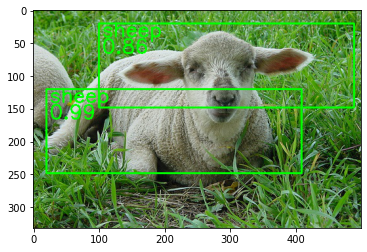


Image: 86
Total Bounding Boxes:
	Before applying NMS: 34
	After applying NMS: 1


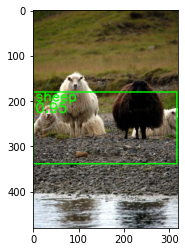


Image: 87
Total Bounding Boxes:
	Before applying NMS: 15
	After applying NMS: 1


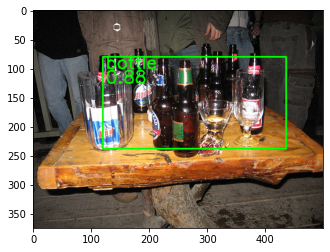


Image: 88
Total Bounding Boxes:
	Before applying NMS: 229
	After applying NMS: 2


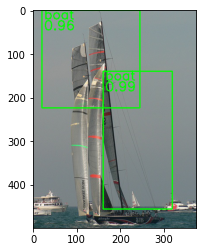


Image: 89
Total Bounding Boxes:
	Before applying NMS: 33
	After applying NMS: 2


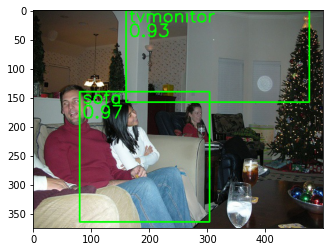


Image: 90
Total Bounding Boxes:
	Before applying NMS: 8
	After applying NMS: 2


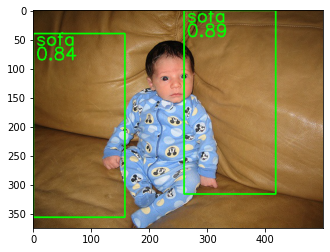


Image: 91
Total Bounding Boxes:
	Before applying NMS: 152
	After applying NMS: 2


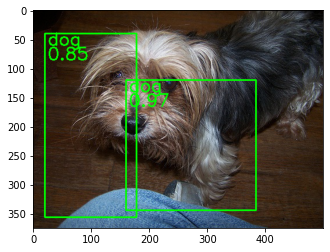


Image: 92
Total Bounding Boxes:
	Before applying NMS: 0
	After applying NMS: 0
No object detected


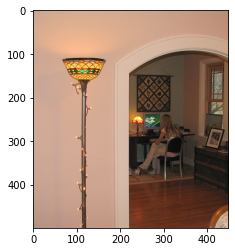


Image: 93
Total Bounding Boxes:
	Before applying NMS: 281
	After applying NMS: 2


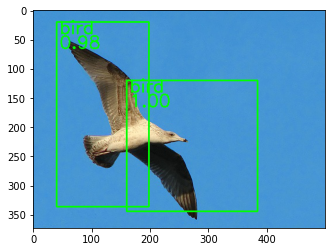


Image: 94
Total Bounding Boxes:
	Before applying NMS: 26
	After applying NMS: 1


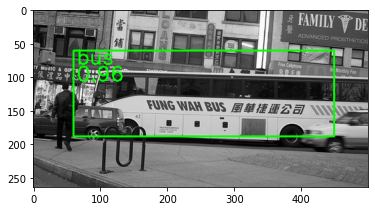


Image: 95
Total Bounding Boxes:
	Before applying NMS: 0
	After applying NMS: 0
No object detected


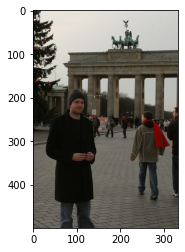


Image: 96
Total Bounding Boxes:
	Before applying NMS: 35
	After applying NMS: 1


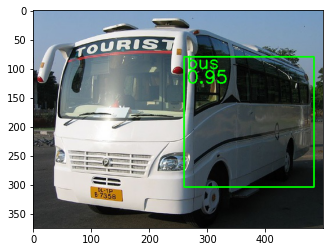


Image: 97
Total Bounding Boxes:
	Before applying NMS: 18
	After applying NMS: 1


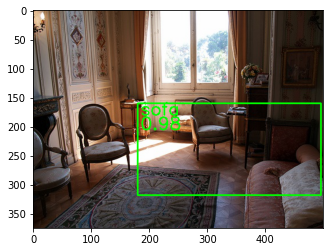


Image: 98
Total Bounding Boxes:
	Before applying NMS: 224
	After applying NMS: 1


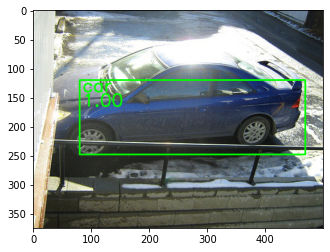


Image: 99
Total Bounding Boxes:
	Before applying NMS: 184
	After applying NMS: 1


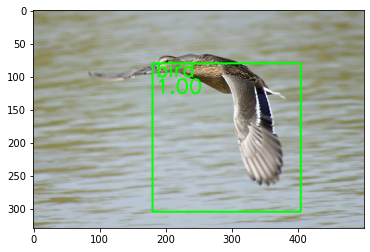


Image: 100
Total Bounding Boxes:
	Before applying NMS: 2
	After applying NMS: 1


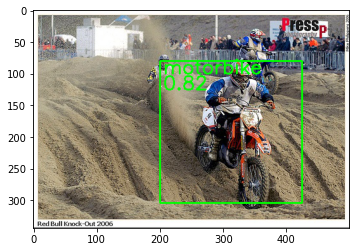

In [31]:
# instead of removing patches with confidence below background_thresh, I think now we should ignore the patches with output as 'background' class
stride = 20
window_size = 224
window_batch_size = 16
background_thresh = 0.8
iou_threshold = 0.1

sigmoid_transformation = torch.nn.Sigmoid()

gt_bboxes = []
pred_bboxes = []

# Create an empty numpy array to store the total list of predicted bounding-boxes (after applying nms)
total_final_boxes = np.empty((0, 7))

classes = ['aeroplane', 'bicycle', 'bird', 'boat',
               'bottle', 'bus', 'car', 'cat', 'chair',
               'cow', 'diningtable', 'dog', 'horse',
               'motorbike', 'person', 'pottedplant',
               'sheep', 'sofa', 'train', 'tvmonitor', 'bg']

with torch.no_grad():
    
    for idx in range(1, 101):
        
        print('\nImage:', idx)
        
        # Get the data and target for the index
        data, target = dataloader.__getitem__(idx)
        
        # Save the data in the form of 3d-numpy array for plotting later
        # Convert PIL image to numpy array with 3 channels. https://stackoverflow.com/questions/44955656/how-to-convert-rgb-pil-image-to-numpy-array-with-3-channels
        original_data = np.array(data)
        
        # Apply transformations
        data = test_transforms(data)
        
        # Append each of the ground-truth bounding box in the current image to the
        # list in the following format [index, class_index, confidence_score, x1, y1, x2, y2]
        for obj in target['annotation']['object']:
            xmin = int(obj['bndbox']['xmin'])
            ymin = int(obj['bndbox']['ymin'])
            xmax = int(obj['bndbox']['xmax'])
            ymax = int(obj['bndbox']['ymax'])
            label = classes.index(obj['name'])
            gt_bboxes.append([idx, label, 100, xmin, ymin, xmax, ymax])
        
        # Convert data to numpy format and apply transpose to make channel dimensions as the last dimension
        image = data.cpu().detach().numpy()
        image = np.transpose(image, (1, 2, 0))
        image = image.astype(float)
        
        # Create an empty numpy array to store the total list of detected bounding-boxes
        total_bounding_boxes = np.empty((0, 7))

        # Run sliding-window detection or the following aspect ratios
        for aspect_ratio in [1, 2, 3, 0.5, 0.33]:
        
            # Get the sliding windows accross the input image with given window-size, aspect_ratio and stride
            windows, bounding_boxes = sliding_windows(image, window_size=window_size, aspect_ratio=aspect_ratio, stride=stride)
    
            # print('Windows:', windows.shape, 'Bounding Boxes:', bounding_boxes.shape, 'Aspect Ratio:', aspect_ratio)
            
            # Calculate the number of batches based on the number of windows we got from sliding_windows()
            n_batches = int(len(windows)/window_batch_size)
            
            # Create an empty numpy array to store the sigmoid output vector for each window
            output = np.empty((0, 21))
            
            # Skip to the next iterations if no windows available for the current setting
            if n_batches == 0:
                continue
        
            # Iterate over the batches of windows
            for i in range(n_batches):
                
                # Get the windows for the current batch
                batch = windows[i*window_batch_size : (i+1)*window_batch_size]
                
                # Convert the batch of windows to float tensors
                batch_tensor = torch.from_numpy(batch)
                batch_tensor = batch_tensor.to(torch.float32)
    
                # Run the inputs through the model
                batch_tensor = batch_tensor.to(device)
                batch_output = model(batch_tensor)
        
                # Apply sigmoid on the softmax outputs
                batch_output = sigmoid_transformation(batch_output)
                
                # Convert the batch output tensors to numpy array
                batch_output = batch_output.cpu().detach().numpy()
                output = np.append(output, batch_output, axis=0)
        
            # Find the max confidence score and the index of that score
            max_values = np.max(output, axis=1)
            max_index = np.argmax(output, axis=1)
        
            # Concatenate the data sample index number, class label index, and the max confidence score column to bounding-boxes list
            bounding_boxes = np.c_[[idx for _ in range(len(max_index))], max_index, max_values, bounding_boxes[:len(output)]]
            
            # Keep the bounding-boxes where the max confidence score is above a certain-threshold
            bounding_boxes = bounding_boxes[bounding_boxes[:, 2] > background_thresh]
            
            # When the following line runs for the first time, assign the current bounding-boxes list to the total_bounding_boxes variable
            # print(total_bounding_boxes, len(total_bounding_boxes))
            if len(total_bounding_boxes) == 0:
                total_bounding_boxes = bounding_boxes
            # For the subsequent iterations, vertically stack the list of bounding-boxes to the total_bounding_boxes
            else:
                total_bounding_boxes = np.vstack((total_bounding_boxes, bounding_boxes))
            
            # print('Model output:', output.shape, 'Total Bounding Boxes:', total_bounding_boxes.shape)

        print('Total Bounding Boxes:')
        print('\tBefore applying NMS:', len(total_bounding_boxes))

        # Apply non-maximum suppression to get the final bounding boxes
        final_bb = non_maximum_suppression(total_bounding_boxes, iou_threshold=iou_threshold)
    
        print('\tAfter applying NMS:', len(final_bb))
        
        # Plot the final bounding boxes over the input image
        plot_bounding_boxes(original_data.copy(), final_bb, save=True, loc='/content/gdrive/MyDrive/Colab/detection_results')

        # When the following line runs for the first time, assign the current final bounding-boxes list to the total_final_boxes variable
        # print(total_final_boxes, len(total_final_boxes))
        if len(total_final_boxes) == 0:
            total_final_boxes = final_bb
        # For the subsequent iterations, vertically stack the list of bounding-boxes to the total_final_boxes
        else:
            total_final_boxes = np.vstack((total_final_boxes, final_bb))

In [40]:
print('Mean Average Precision', mean_average_precision(total_final_boxes, gt_bboxes, iou_threshold=0.5, num_classes=20).item())

Class: aeroplane , Average Precision: 0.4999995231628418
Class: bicycle , Average Precision: 0.21428558230400085
Class: bird , Average Precision: 0.49586021900177
Class: boat , Average Precision: 0.08854161947965622
Class: bottle , Average Precision: 0.07692303508520126
Class: bus , Average Precision: 0.4999995827674866
Class: car , Average Precision: 0.2121211290359497
Class: cat , Average Precision: 0.4677974581718445
Class: chair , Average Precision: 0.0
Class: cow , Average Precision: 0.0
Class: diningtable , Average Precision: 0.023809511214494705
Class: dog , Average Precision: 0.5569442510604858
Class: horse , Average Precision: 0.799999475479126
Class: motorbike , Average Precision: 0.19791656732559204
Class: person , Average Precision: 0.025210071355104446
Class: pottedplant , Average Precision: 0.12499992549419403
Class: sheep , Average Precision: 0.49999964237213135
Class: sofa , Average Precision: 0.15327373147010803
Class: train , Average Precision: 0.43809500336647034
Cla

In [25]:
print(len(gt_bboxes), len(total_final_boxes))

31 2
